In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import folium


In [2]:
data = pd.read_csv('../Divvy_2024_All_Months_Combined.csv')

/var/folders/jh/2z6063n91jn5nsq56zvsxlhw0000gn/T/ipykernel_23896/4127983582.py:1: DtypeWarning: Columns (7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('../Divvy_2024_All_Months_Combined.csv')


In [3]:
# data.drop(columns=['Unnamed: 0'], inplace=True)
data.head()

,Unnamed: 0,ride_id,rideable_type,rideable_type_code,started_at,ended_at,ride_length,month_name,day_of_week,hour_of_day,start_station_name,start_station_id,start_lat,start_lng,end_station_name,end_station_id,end_lat,end_lng,member_casual,member_casual_code
0,0.0,597F4161CCE5A7C9,classic_bike,0.0,2024-04-09 10:19:14,2024-04-09 10:22:02,2.800000,April,Tuesday,10 AM,Ellis Ave & 55th St,KA1504000076,41.794301,-87.601450,Ellis Ave & 58th St,TA1309000011,41.788746,-87.601334,member,1.0
1,1.0,E0EDA091FC69402A,classic_bike,0.0,2024-04-06 22:23:31,2024-04-06 22:30:03,6.533333,April,Saturday,10 PM,Field Museum,13029,41.865312,-87.617867,DuSable Lake Shore Dr & Monroe St,13300,41.880958,-87.616743,casual,0.0
2,2.0,C384D6B5AF4E869A,classic_bike,0.0,2024-04-11 18:05:06,2024-04-11 18:11:20,6.233333,April,Thursday,06 PM,Lincoln Ave & Roscoe St*,chargingstx5,41.943350,-87.670668,Western Ave & Roscoe St,15634,41.943034,-87.687288,member,1.0
3,3.0,D920556786E473B5,classic_bike,0.0,2024-04-22 05:50:03,2024-04-22 05:53:05,3.033333,April,Monday,05 AM,Rush St & Hubbard St,KA1503000044,41.890173,-87.626185,Dearborn St & Erie St,13045,41.893992,-87.629318,member,1.0
4,4.0,ED290370BA829535,electric_bike,1.0,2024-04-05 19:10:53,2024-04-05 19:21:53,11.000000,April,Friday,07 PM,Morgan St & 31st St,TA1308000046,41.837717,-87.651090,Indiana Ave & 31st St,TA1308000036,41.838842,-87.621857,member,1.0


# Basic IDA

### Trip anomalies / outliers

In [4]:
long_trips = data[data['ride_length'] > 180]
short_trips = data[data['ride_length'] < 1]

long_trips_count = long_trips.shape[0]
short_trips_count = short_trips.shape[0]

long_trips_count, short_trips_count


(2534, 9150)

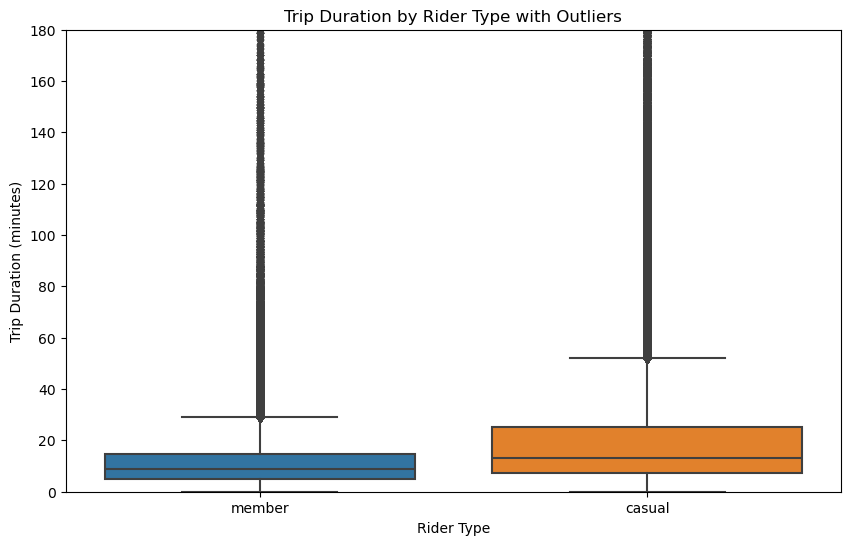

In [5]:
plt.figure(figsize=(10,6))
sns.boxplot(x='member_casual', y='ride_length', data=data)
plt.ylim(0, 180)
plt.xlabel('Rider Type')
plt.ylabel('Trip Duration (minutes)')
plt.title('Trip Duration by Rider Type with Outliers')
plt.show()



### 1. Peak Usage Hours

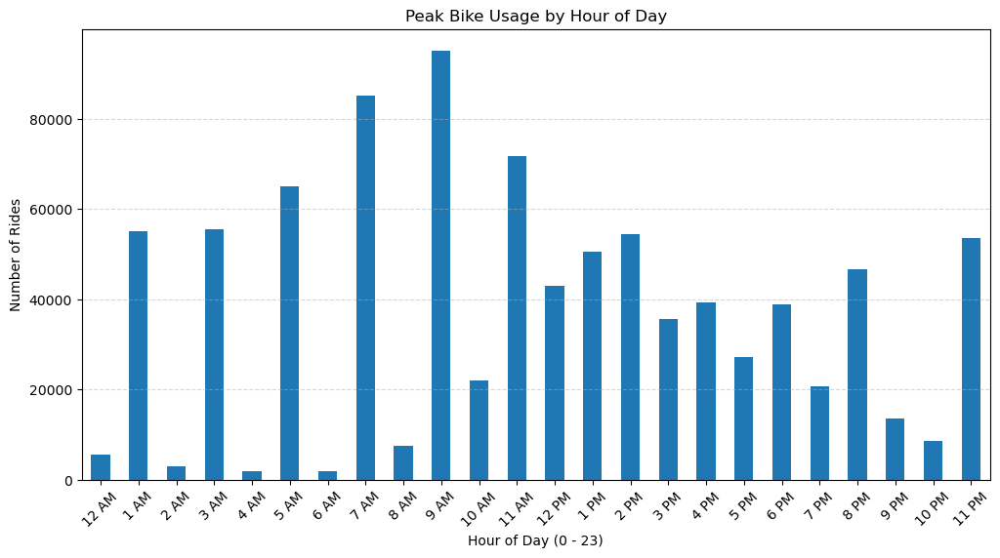

In [6]:
peak_usage_hours = data.groupby('hour_of_day')['ride_id'].count()

plt.figure(figsize=(12, 6))
peak_usage_hours.plot(kind='bar')

plt.title('Peak Bike Usage by Hour of Day')
plt.xlabel('Hour of Day (0 - 23)')
plt.ylabel('Number of Rides')
hour_labels = ['12 AM','1 AM','2 AM','3 AM','4 AM','5 AM','6 AM','7 AM','8 AM','9 AM','10 AM','11 AM',
               '12 PM','1 PM','2 PM','3 PM','4 PM','5 PM','6 PM','7 PM','8 PM','9 PM','10 PM','11 PM']

plt.xticks(range(24), hour_labels, rotation=45)

plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()


### 2. Weekday vs. Weekend trends

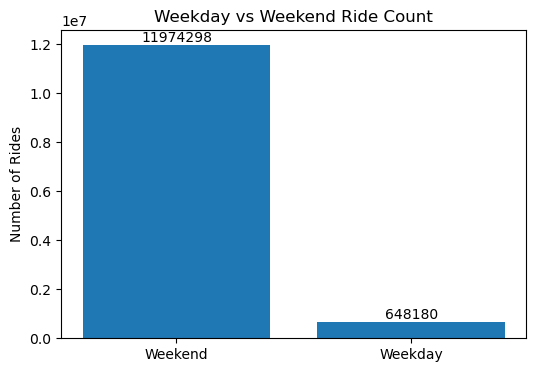

In [7]:
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
weekend = ['Saturday', 'Sunday']
data['Weekday'] = data['day_of_week'].apply(lambda x: 1 if x in weekdays else 0)
weekday_vs_weekend_trend = data.groupby('Weekday')['ride_id'].count()

plt.figure(figsize=(6,4))
bars = plt.bar(['Weekend', 'Weekday'], weekday_vs_weekend_trend)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1000, height, ha='center', va='bottom')

plt.ylabel('Number of Rides')
plt.title('Weekday vs Weekend Ride Count')
plt.show()

### 3. Seasonal variations

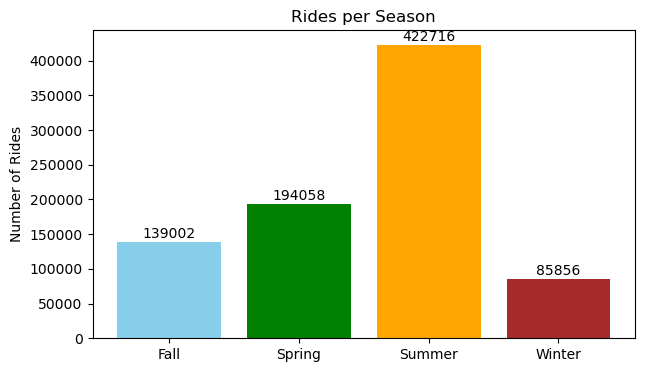

In [8]:
season_map = {
    'December': 'Winter', 'January': 'Winter', 'February': 'Winter',
    'March': 'Spring', 'April': 'Spring', 'May': 'Spring',
    'June': 'Summer', 'July': 'Summer', 'August': 'Summer', 'September': 'Summer',
    'October': 'Fall', 'November': 'Fall'
}

data['Season'] = data['month_name'].map(season_map)

seasonal_variations = data.groupby('Season')['ride_id'].count()

plt.figure(figsize=(7,4))
bars = plt.bar(seasonal_variations.index, seasonal_variations.values, color=['skyblue','green','orange','brown'])

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1000, height, ha='center', va='bottom')

plt.ylabel('Number of Rides')
plt.title('Rides per Season')
plt.show()


### 4. Monthly variations

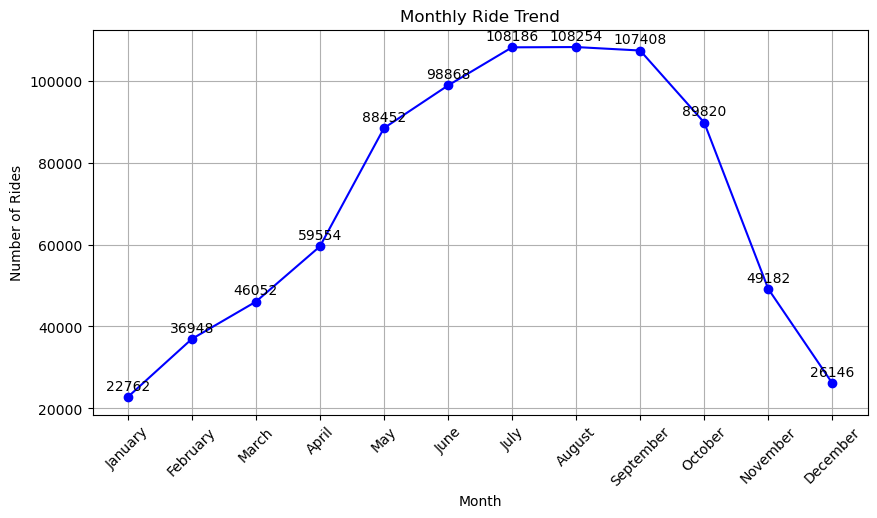

In [9]:
monthly_variations = data.groupby('month_name')['ride_id'].count()
month_order = ['January','February','March','April','May','June','July','August','September','October','November','December']
monthly_variations = data.groupby('month_name')['ride_id'].count().reindex(month_order)

plt.figure(figsize=(10,5))
plt.plot(monthly_variations.index, monthly_variations.values, marker='o', linestyle='-', color='blue')

for i, value in enumerate(monthly_variations.values):
    plt.text(i, value + 1000, value, ha='center', va='bottom')

plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.title('Monthly Ride Trend')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

### 5. Most popular stations

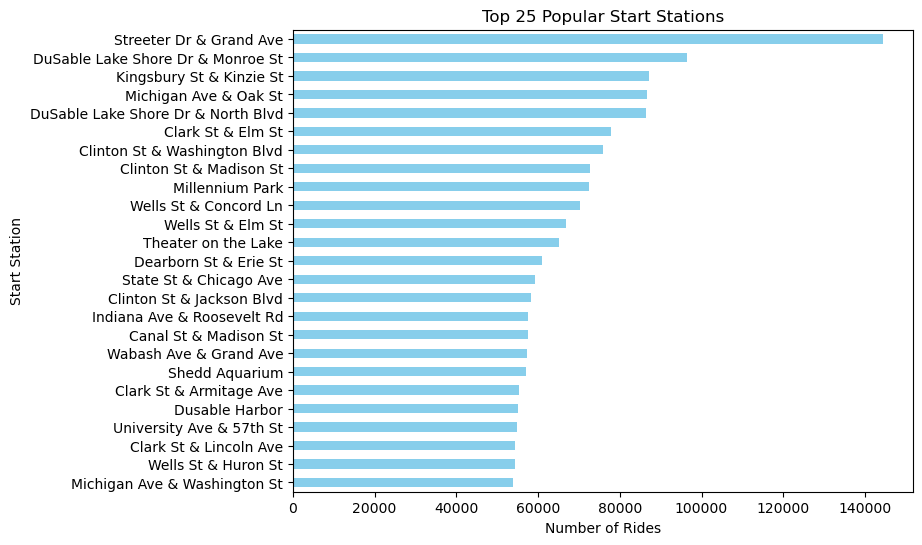

In [10]:
popular_stations = data.groupby('start_station_name')['ride_id'].count().sort_values(ascending=False).head(25)
popular_stations.plot(kind='barh', figsize=(8,6), color='skyblue')
plt.xlabel('Number of Rides')
plt.ylabel('Start Station')
plt.title('Top 25 Popular Start Stations')
plt.gca().invert_yaxis() 
plt.show()


### 6. Common routes (origin → destination)

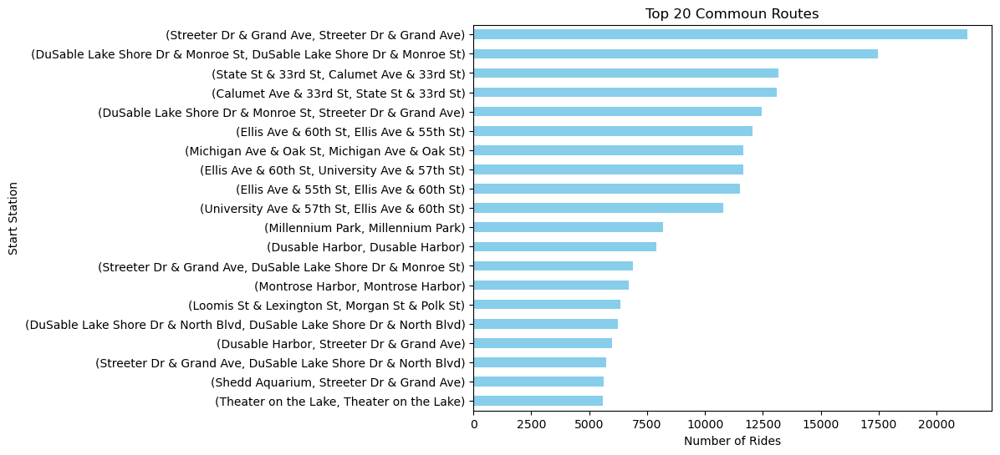

In [11]:
common_routes = data.groupby(['start_station_name', 'end_station_name'])['ride_id'].count().sort_values(ascending=False).head(20)

common_routes.plot(kind='barh', figsize=(8,6), color='skyblue')
plt.xlabel('Number of Rides')
plt.ylabel('Start Station')
plt.title('Top 20 Commoun Routes')
plt.gca().invert_yaxis() 
plt.show()

# Intermediate EDA - Trip Duration

### 7. Trip duration distribution

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


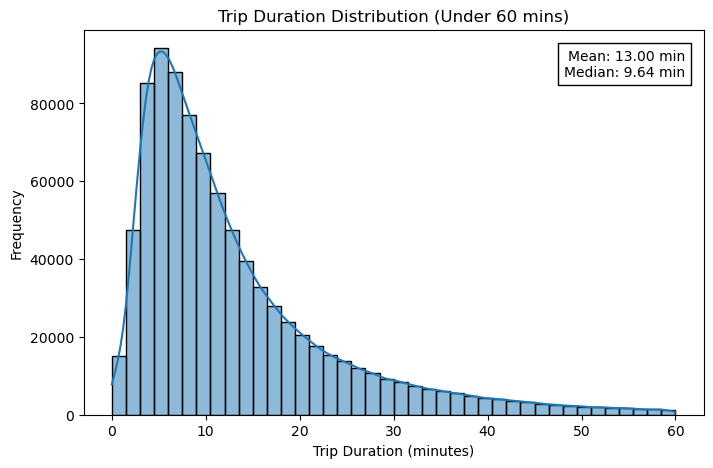

In [12]:
subset = data[data['ride_length'] <= 60]['ride_length']
mean_val = subset.mean()
median_val = subset.median()

plt.figure(figsize=(8,5))
sns.histplot(subset, bins=40, kde=True)

plt.xlabel("Trip Duration (minutes)")
plt.ylabel("Frequency")
plt.title("Trip Duration Distribution (Under 60 mins)")

plt.text(
    0.97, 0.95,
    f"Mean: {mean_val:.2f} min\nMedian: {median_val:.2f} min",
    transform=plt.gca().transAxes,
    fontsize=10,
    ha='right', va='top',
    bbox=dict(facecolor='white', edgecolor='black')
)

plt.show()

### 8. Short vs Long Rides

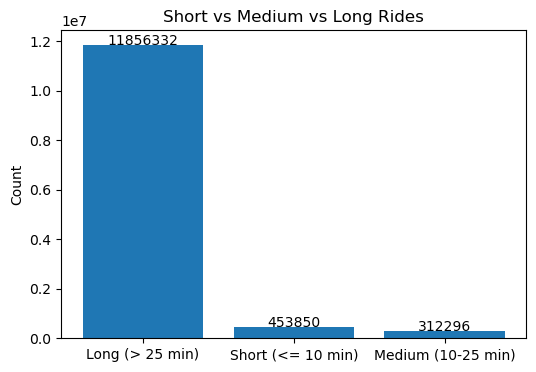

In [13]:
def ride_category(x):
    if x <= 10:
        return 'Short (<= 10 min)'
    elif x <= 25:
        return 'Medium (10-25 min)'
    else:
        return 'Long (> 25 min)'

data['ride_category'] = data['ride_length'].apply(ride_category)

ride_category_counts = data['ride_category'].value_counts()
ride_category_counts

plt.figure(figsize=(6,4))
bars = plt.bar(ride_category_counts.index, ride_category_counts.values)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, height+2500, height, ha='center')

plt.title("Short vs Medium vs Long Rides")
plt.ylabel("Count")
plt.show()


### 9. Trip Duration by Season

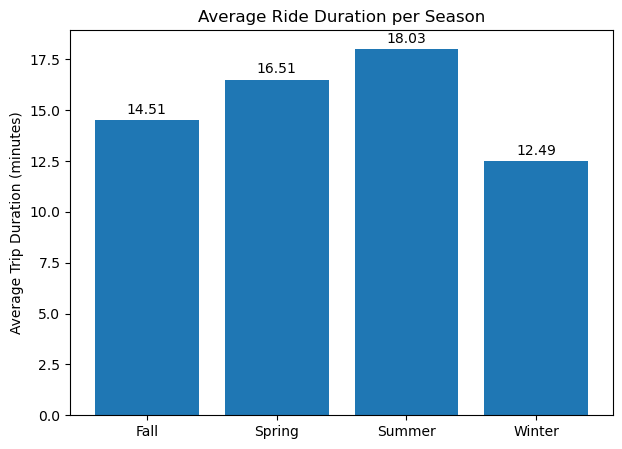

In [14]:
season_duration = data.groupby('Season')['ride_length'].mean()

plt.figure(figsize=(7,5))
bars = plt.bar(season_duration.index, season_duration.values)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, height+0.3, round(height,2), ha='center')

plt.ylabel('Average Trip Duration (minutes)')
plt.title('Average Ride Duration per Season')
plt.show()


### 10. Average Trip Duration by Month

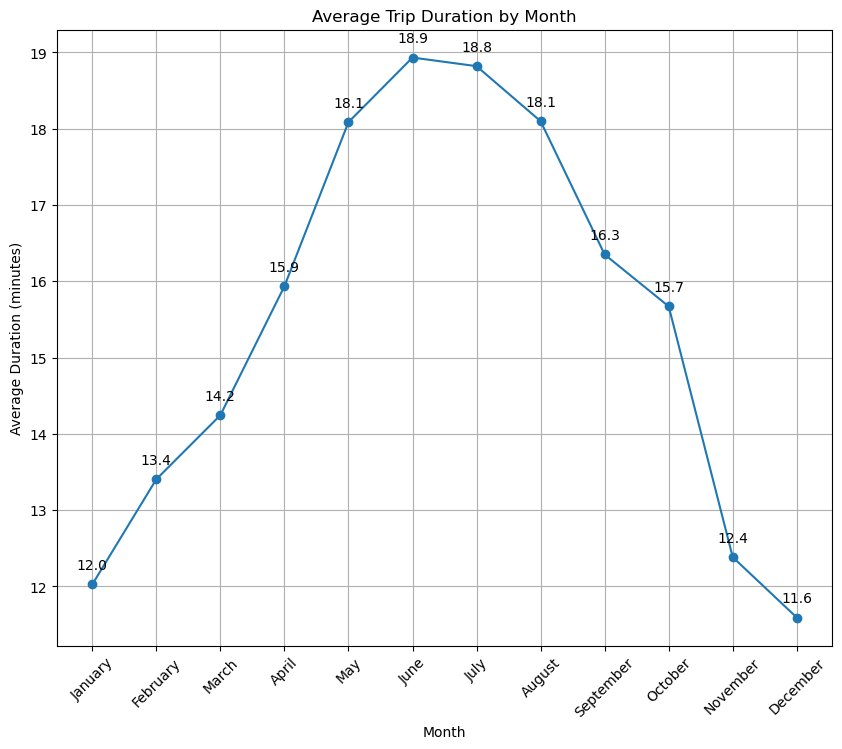

In [15]:
month_order = ['January','February','March','April','May','June','July','August','September','October','November','December']
monthly_duration = data.groupby('month_name')['ride_length'].mean().reindex(month_order)

plt.figure(figsize=(10,8))
plt.plot(monthly_duration.index, monthly_duration.values, marker='o')

for i, value in enumerate(monthly_duration.values):
    plt.text(i, value+0.2, round(value,1), ha='center')

plt.title("Average Trip Duration by Month")
plt.xlabel("Month")
plt.ylabel("Average Duration (minutes)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


### 11. Average Trip Duration by Hour of the Day

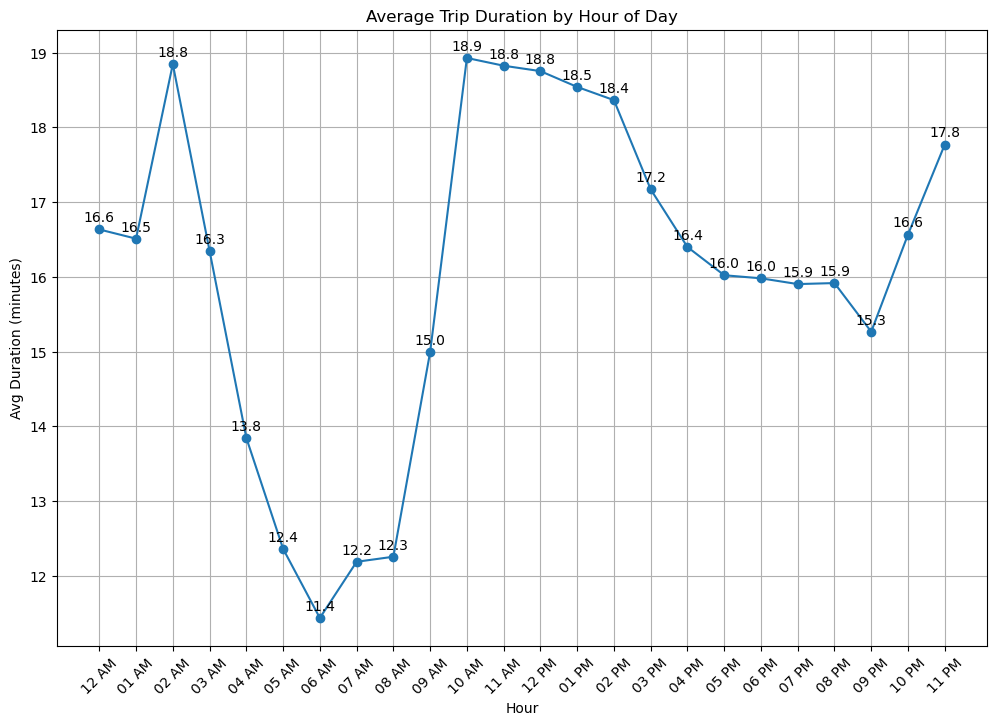

In [16]:
hour_order = [
    '12 AM', '01 AM', '02 AM', '03 AM', '04 AM', '05 AM', '06 AM', '07 AM', '08 AM', '09 AM', '10 AM', '11 AM',
    '12 PM', '01 PM', '02 PM', '03 PM', '04 PM', '05 PM', '06 PM', '07 PM', '08 PM', '09 PM', '10 PM', '11 PM'
]

hourly_duration = data.groupby('hour_of_day')['ride_length'].mean().reindex(hour_order)

plt.figure(figsize=(12,8))
plt.plot(hourly_duration.index, hourly_duration.values, marker='o')

for i, value in enumerate(hourly_duration.values):
    plt.text(i, value + 0.1, round(value,1), ha='center')

plt.title("Average Trip Duration by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Avg Duration (minutes)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


### 12. Average Trip Duration by Day of the Week

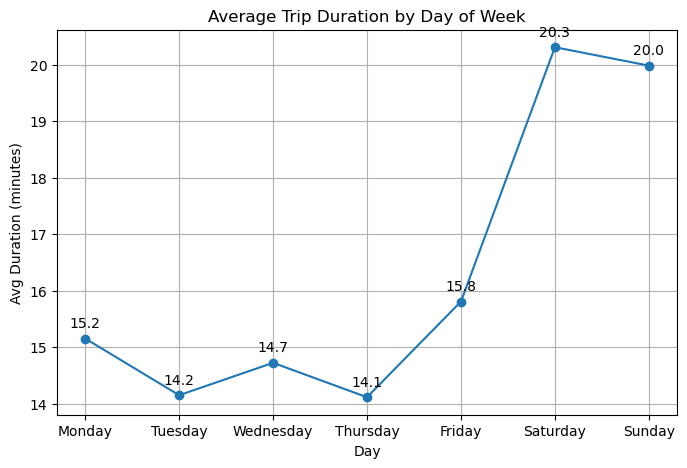

In [17]:
weekday_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
weekday_duration = data.groupby('day_of_week')['ride_length'].mean().reindex(weekday_order)

plt.figure(figsize=(8,5))
plt.plot(weekday_duration.index, weekday_duration.values, marker='o')

for i, value in enumerate(weekday_duration.values):
    plt.text(i, value+0.2, round(value,1), ha='center')

plt.title("Average Trip Duration by Day of Week")
plt.xlabel("Day")
plt.ylabel("Avg Duration (minutes)")
plt.grid(True)
plt.show()


### 13. Average Trip Duration by Hour and Day of the Week

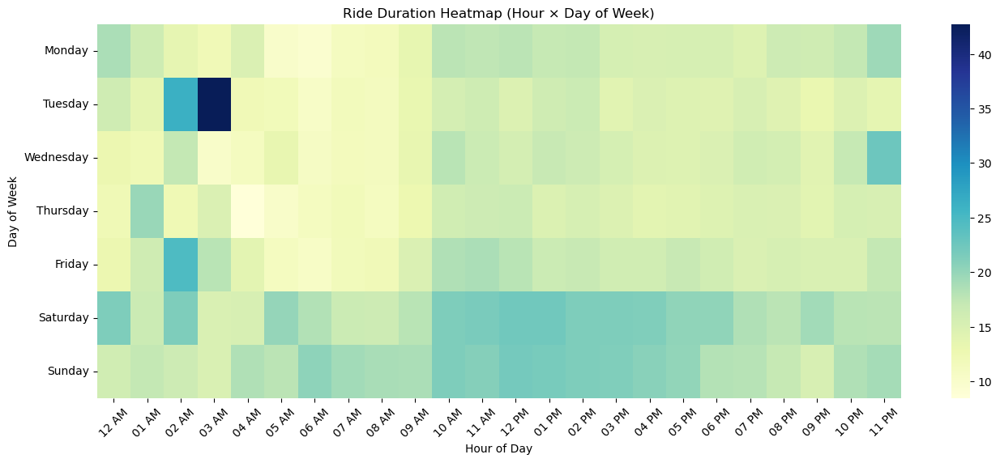

In [18]:

hour_order = [
    '12 AM','01 AM','02 AM','03 AM','04 AM','05 AM','06 AM','07 AM','08 AM','09 AM','10 AM','11 AM',
    '12 PM','01 PM','02 PM','03 PM','04 PM','05 PM','06 PM','07 PM','08 PM','09 PM','10 PM','11 PM'
]

weekday_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

pivot = data.pivot_table(
    values='ride_length',
    index='day_of_week',
    columns='hour_of_day',
    aggfunc='mean'
)

pivot = pivot.reindex(weekday_order)
pivot = pivot[hour_order]

plt.figure(figsize=(16,6))
sns.heatmap(pivot, cmap='YlGnBu')

plt.title("Ride Duration Heatmap (Hour × Day of Week)")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.xticks(rotation=45)
plt.show()


# Intermediate EDA - Rider type analysis (Guest vs. Member)

### 13. Member vs Casual Riders

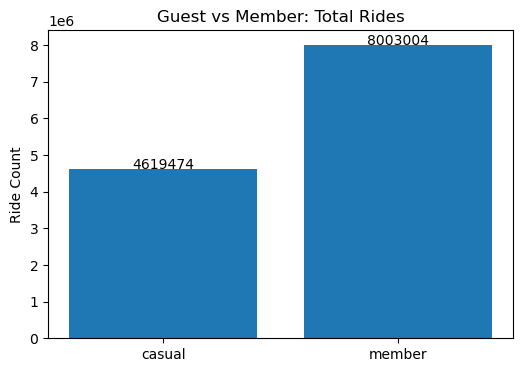

In [19]:
rider_type_analysis = data.groupby('member_casual')['ride_id'].count()

plt.figure(figsize=(6,4))
bars = plt.bar(rider_type_analysis.index, rider_type_analysis.values)

for bar in bars:
    h = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, h+2000, h, ha='center')

plt.ylabel('Ride Count')
plt.title('Guest vs Member: Total Rides')
plt.show()




### 14. Average Trip Duration by Member Type

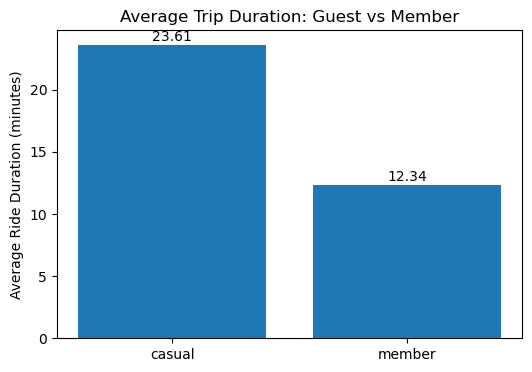

In [20]:
avg_duration_by_type = data.groupby('member_casual')['ride_length'].mean()

plt.figure(figsize=(6,4))
bars = plt.bar(avg_duration_by_type.index, avg_duration_by_type.values)

for bar in bars:
    h = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2, h+0.3, round(h,2), ha='center')

plt.ylabel('Average Ride Duration (minutes)')
plt.title('Average Trip Duration: Guest vs Member')
plt.show()


### 15. Proportion of Ride Categories by Member Type

<Figure size 800x500 with 0 Axes>

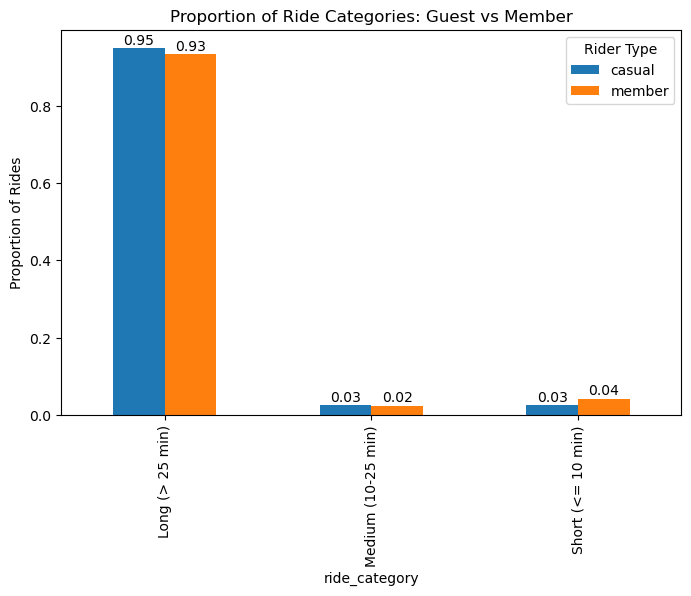

In [70]:
rider_grouping_by_ride_category = data.groupby(['ride_category', 'member_casual'])['ride_id'].count().unstack()
rider_grouping_by_ride_category = rider_grouping_by_ride_category.div(rider_grouping_by_ride_category.sum(axis=0), axis=1)

plt.figure(figsize=(8,5))
bars = rider_grouping_by_ride_category.plot(kind='bar', figsize=(8,5))

for container in bars.containers:
    for bar in container:
        h = bar.get_height()
        bars.text(bar.get_x()+bar.get_width()/2, h+0.01, f"{h:.2f}", ha='center')

plt.ylabel('Proportion of Rides')
plt.title('Proportion of Ride Categories: Guest vs Member')
plt.legend(title='Rider Type')
plt.show()


### 16. Hourly Ride Pattern by Member Type

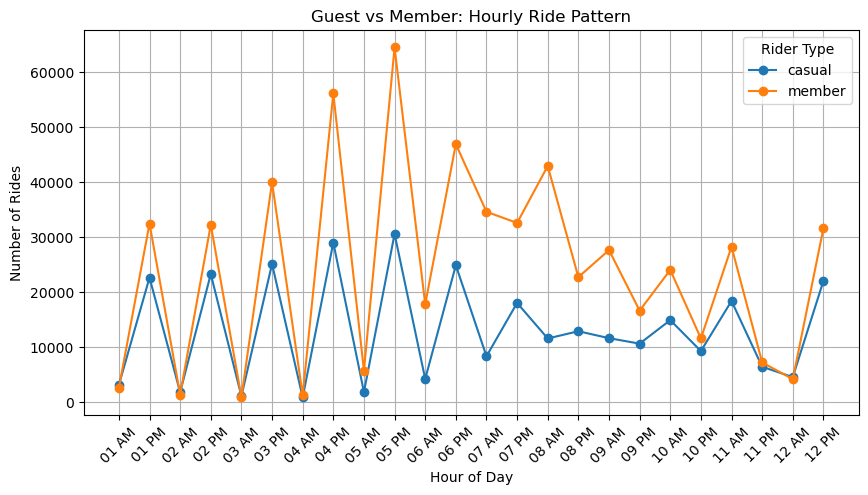

In [22]:
rider_grouping_by_time = data.groupby(['hour_of_day', 'member_casual'])['ride_id'].count().unstack()

plt.figure(figsize=(10,5))
for col in rider_grouping_by_time.columns:
    plt.plot(rider_grouping_by_time.index, rider_grouping_by_time[col], marker='o', label=col)

plt.xlabel('Hour of Day')
plt.ylabel('Number of Rides')
plt.title('Guest vs Member: Hourly Ride Pattern')
plt.xticks(rotation=45)
plt.legend(title='Rider Type')
plt.grid(True)
plt.show()


### 17. Ride Pattern By Day of the Week

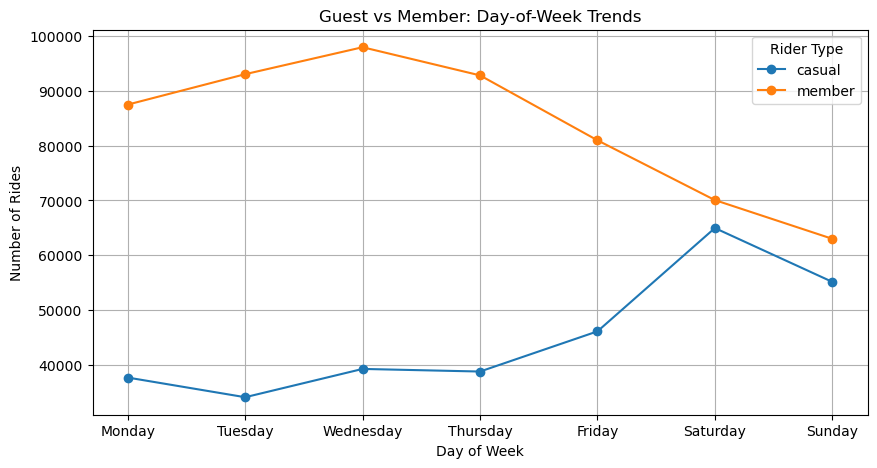

In [23]:
day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
rider_grouping_by_time = data.groupby(['day_of_week', 'member_casual'])['ride_id'].count().unstack()
rider_grouping_by_time = rider_grouping_by_time.reindex(day_order)

plt.figure(figsize=(10,5))
for col in rider_grouping_by_time.columns:
    plt.plot(rider_grouping_by_time.index, rider_grouping_by_time[col], marker='o', label=col)

plt.xlabel('Day of Week')
plt.ylabel('Number of Rides')
plt.title('Guest vs Member: Day-of-Week Trends')
plt.legend(title='Rider Type')
plt.grid(True)
plt.show()


### 18. Bike Type Preference by Member Type

<Figure size 800x500 with 0 Axes>

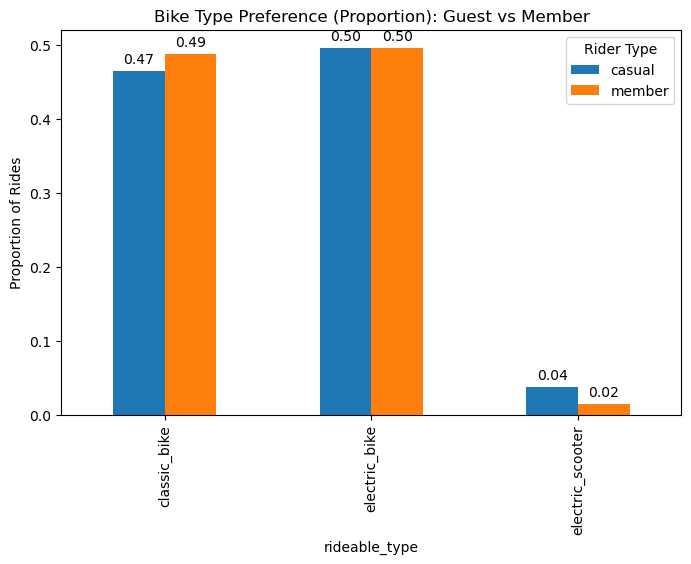

In [24]:
bike_pref = data.groupby(['rideable_type', 'member_casual'])['ride_id'].count().unstack()
bike_pref = bike_pref.div(bike_pref.sum(axis=0), axis=1)

plt.figure(figsize=(8,5))
bars = bike_pref.plot(kind='bar', figsize=(8,5))

for container in bars.containers:
    for bar in container:
        h = bar.get_height()
        bars.text(bar.get_x()+bar.get_width()/2, h+0.01, f"{h:.2f}", ha='center')

plt.ylabel('Proportion of Rides')
plt.title('Bike Type Preference (Proportion): Guest vs Member')
plt.legend(title='Rider Type')
plt.show()


# Intermediate EDA - Station-level performance analysis

This section will help in finding out which stations run out of bikes often based on the outflow. If the number is positive (ends-start), it means more bikes are returned to this station as compared to picking up.

Where as, if the number is negative, it means more bikes are taken from this station and it will help in operational insights.

### 19. Station Flow

In [25]:
station_starts = data.groupby('start_station_name')['ride_id'].count()
station_ends = data.groupby('end_station_name')['ride_id'].count()

station_flow = (station_ends - station_starts).fillna(0).sort_values(ascending=False)
station_flow.head()

DuSable Lake Shore Dr & North Blvd    7750.0
Sheffield Ave & Waveland Ave          6962.0
Franklin St & Monroe St               3296.0
Streeter Dr & Grand Ave               2858.0
Sangamon St & Lake St                 2836.0
Name: ride_id, dtype: float64

### 20. Station Wise Outflow (More bikes taken than returned)

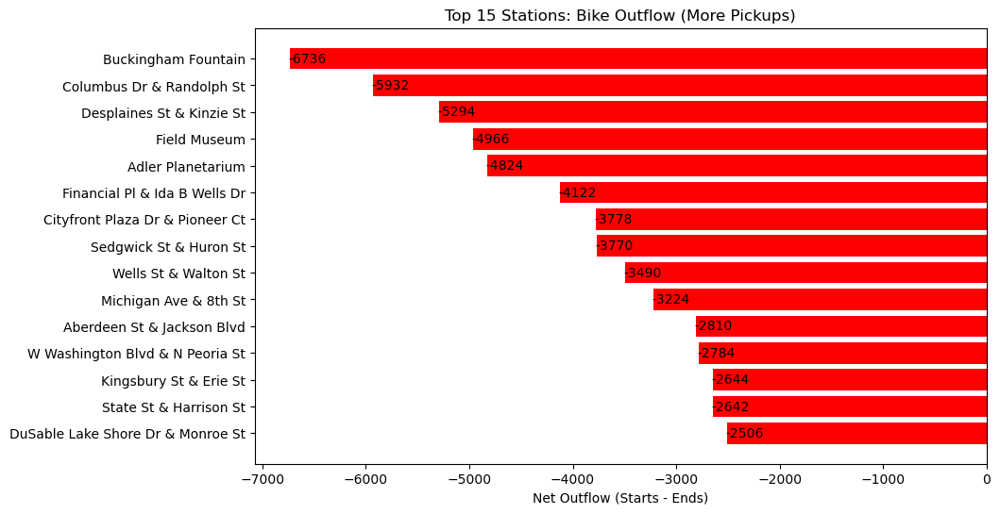

In [26]:
top_outflow = station_flow.sort_values().head(15)

plt.figure(figsize=(10,6))
bars = plt.barh(top_outflow.index, top_outflow.values, color='red')
plt.gca().invert_yaxis()

for bar in bars:
    h = bar.get_width()
    plt.text(h - 15, bar.get_y() + bar.get_height()/2, int(h), va='center')

plt.xlabel('Net Outflow (Starts - Ends)')
plt.title('Top 15 Stations: Bike Outflow (More Pickups)')
plt.show()


### 21. Station Wise Inflow (More bikes returned than taken)

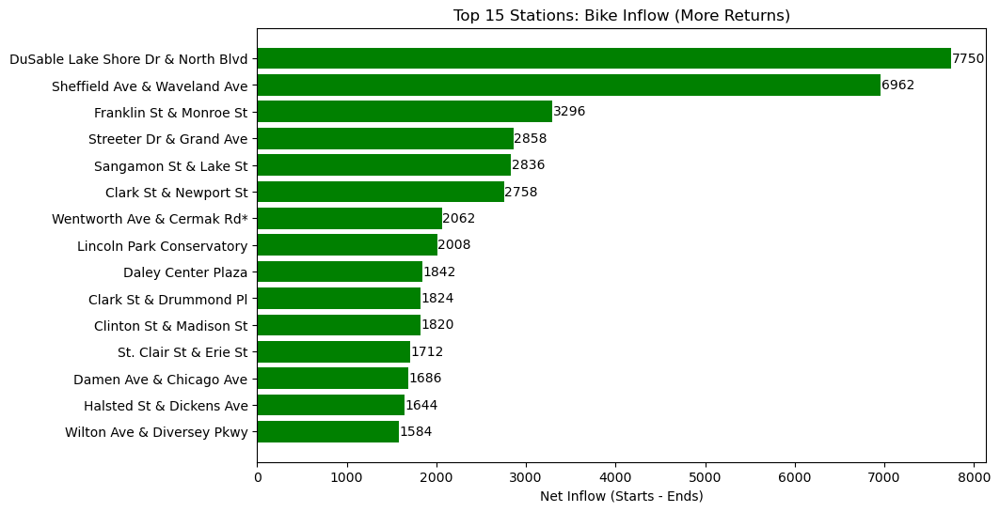

In [27]:
top_inflow = station_flow.head(15)

plt.figure(figsize=(10,6))
bars = plt.barh(top_inflow.index, top_inflow.values, color='green')
plt.gca().invert_yaxis()

for bar in bars:
    h = bar.get_width()
    plt.text(h + 5, bar.get_y() + bar.get_height()/2, int(h), va='center')

plt.xlabel('Net Inflow (Starts - Ends)')
plt.title('Top 15 Stations: Bike Inflow (More Returns)')
plt.show()


### 22. Scatterplot: Starts vs. Ends per Station

The straight line shows that there is not a large imbalance between the number of rides started and number of rides ended per station, which means that the numbers above that we saw in the inflow and outflows are really small as compared to the total number of rides at a station.

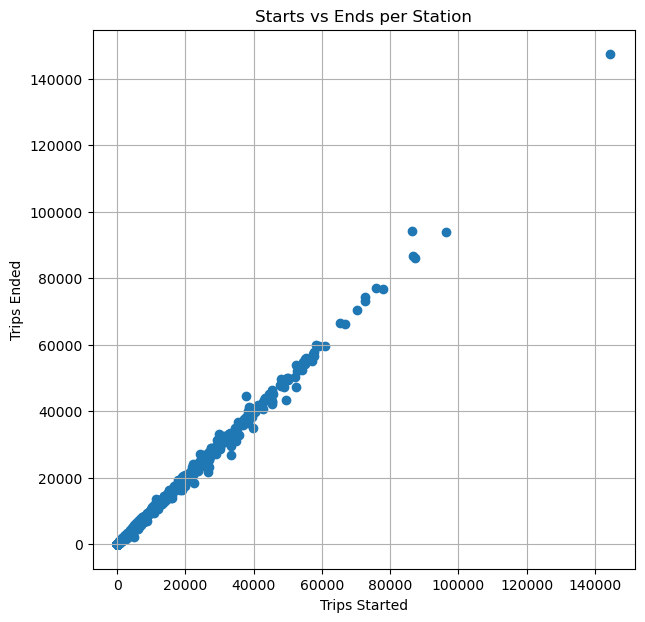

In [28]:
station_starts = data.groupby('start_station_name')['ride_id'].count()
station_ends = data.groupby('end_station_name')['ride_id'].count()

combined = (
    pd.concat([station_starts, station_ends], axis=1)
    .fillna(0)
)
combined.columns = ['starts', 'ends']

plt.figure(figsize=(7,7))
plt.scatter(combined['starts'], combined['ends'])
plt.xlabel('Trips Started')
plt.ylabel('Trips Ended')
plt.title('Starts vs Ends per Station')
plt.grid(True)
plt.show()


### 23. Heatmap: Hour × Station (Top 20 stations)

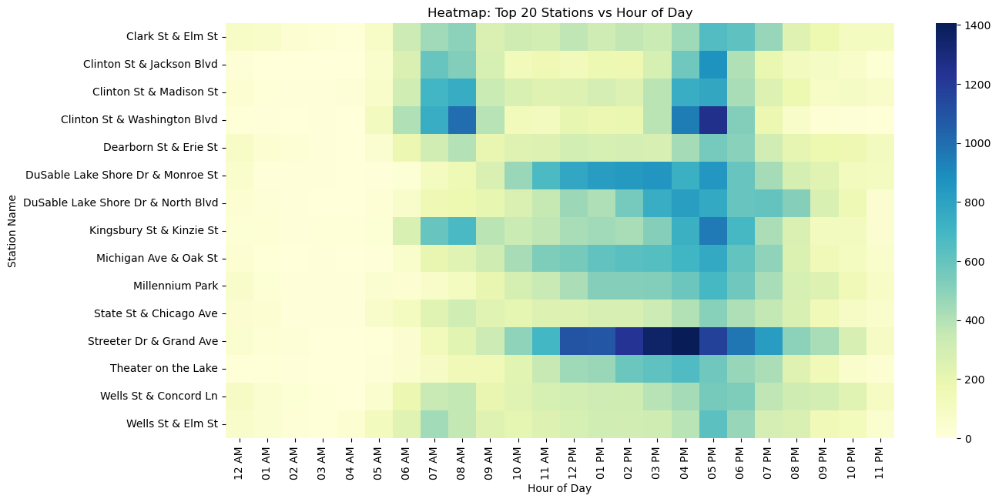

In [29]:
hour_order = [
    '12 AM', '01 AM', '02 AM', '03 AM', '04 AM', '05 AM', '06 AM', '07 AM', 
    '08 AM', '09 AM', '10 AM', '11 AM', '12 PM', '01 PM', '02 PM', '03 PM',
    '04 PM', '05 PM', '06 PM', '07 PM', '08 PM', '09 PM', '10 PM', '11 PM'
]

top15 = data['start_station_name'].value_counts().head(15).index
subset = data[data['start_station_name'].isin(top15)]

heat = subset.groupby(['start_station_name', 'hour_of_day'])['ride_id'] \
             .count().unstack().fillna(0)

heat = heat[hour_order]

plt.figure(figsize=(14, 7))
sns.heatmap(heat, cmap="YlGnBu")
plt.title("Heatmap: Top 20 Stations vs Hour of Day")
plt.xlabel("Hour of Day")
plt.ylabel("Station Name")
plt.show()


# Intermediate EDA - Geo-spatial clustering

### 24. Geo Spatial Clustering of Stations

This plot shows the clustering of stations according to their similarity

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


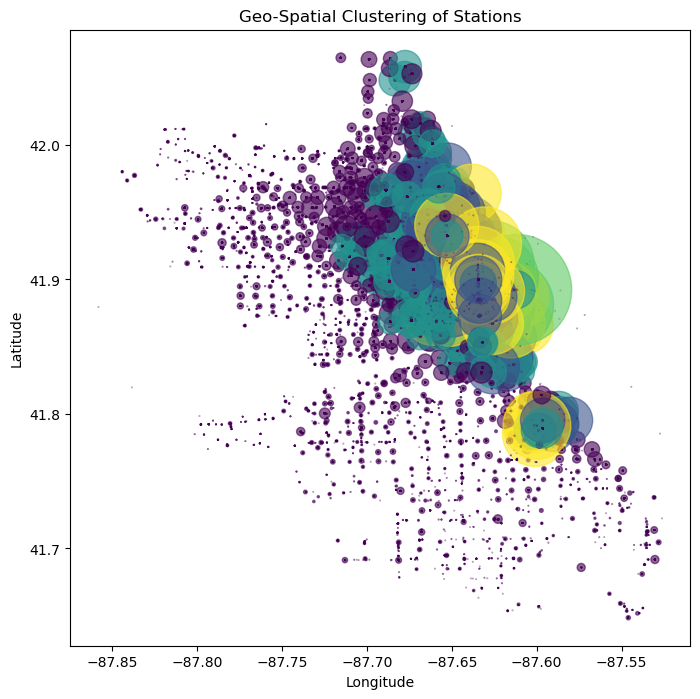

In [30]:
stations = data.groupby(['start_station_name', 'start_lat', 'start_lng'])['ride_id'].count().reset_index()
stations.columns = ['station_name', 'lat', 'lng', 'usage']

X = stations[['lat', 'lng', 'usage']]
kmeans = KMeans(n_clusters=5, random_state=42)
stations['cluster'] = kmeans.fit_predict(X)

plt.figure(figsize=(8,8))
plt.scatter(stations['lng'], stations['lat'], c=stations['cluster'], s=stations['usage']/20, alpha=0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geo-Spatial Clustering of Stations')
plt.show()

### 25. Folium Map Visualization

In [31]:
# m = folium.Map(location=[stations['lat'].mean(), stations['lng'].mean()], zoom_start=12)

# for _, row in stations.iterrows():
#     folium.CircleMarker(
#         location=[row['lat'], row['lng']],
#         radius=row['usage']**0.5,
#         color=None,
#         fill=True,
#         fill_color=['red','blue','green','purple','orange'][row['cluster']],
#         fill_opacity=0.6,
#         popup=f"{row['station_name']}<br>Usage: {row['usage']}<br>Cluster: {row['cluster']}"
#     ).add_to(m)

# m.save('map.html')


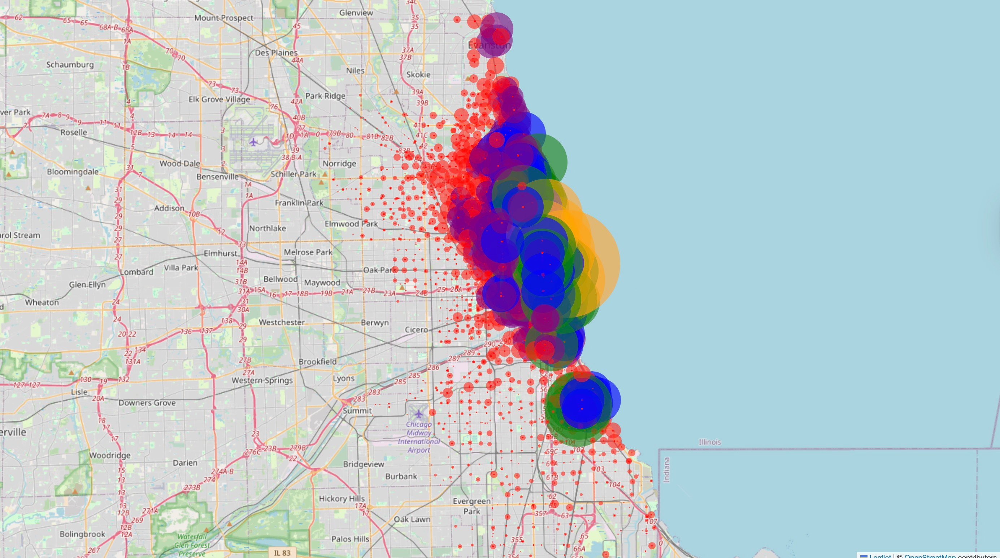

# Intermediate EDA - Bike type analysis

### Distribution of Rideable Types

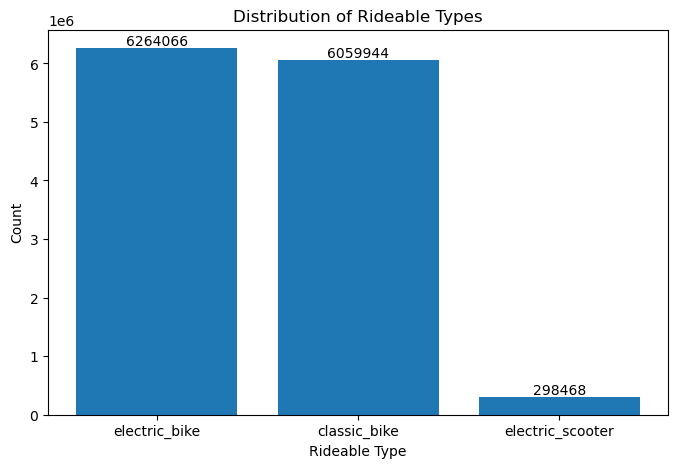

In [43]:
ride_type = data['rideable_type'].value_counts()

plt.figure(figsize=(8,5))
bars = plt.bar(ride_type.index, ride_type.values)

# Show count on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 5, str(height),
             ha='center', va='bottom')

plt.xlabel("Rideable Type")
plt.ylabel("Count")
plt.title("Distribution of Rideable Types")
plt.show()

### Seasonal shift in bike (Preferences)

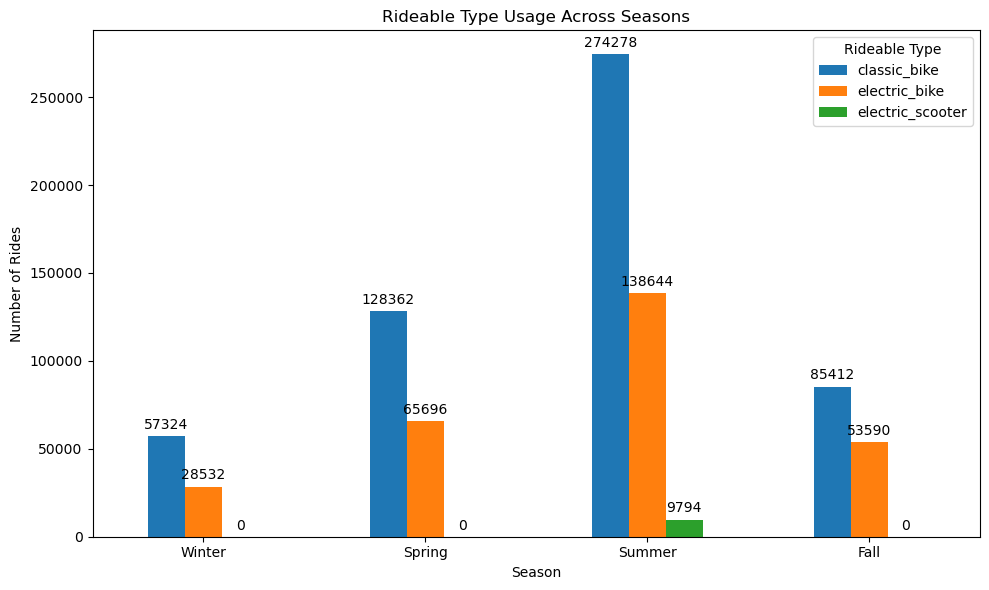

In [57]:
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
ride_preference = (
    data.groupby(['Season', 'rideable_type'])['ride_id']
    .count()
    .unstack()
    .reindex(index=season_order)
    .fillna(0)
)

ax = ride_preference.plot(kind='bar', figsize=(10,6))
ax.set_xlabel('Season')
ax.set_ylabel('Number of Rides')
ax.set_title('Rideable Type Usage Across Seasons')
plt.xticks(rotation=0)
plt.legend(title='Rideable Type')

for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

plt.tight_layout()
plt.show()

### Cluster Stations according to Bike Types

In [ ]:
# import folium

# station_coords = data.groupby('start_station_name')[['start_lat','start_lng']].first().reset_index()
# station_map = pd.merge(station_bike_types, station_coords, left_on='start_station_name', right_on='start_station_name')

# m = folium.Map(location=[station_map['start_lat'].mean(), station_map['start_lng'].mean()], zoom_start=12)

# colors = ['red','blue','green']
# for _, row in station_map.iterrows():
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=10,
#         color=colors[row['cluster']],
#         fill=True,
#         fill_opacity=0.6,
#         popup=f"{row['start_station_name']}<br>Cluster: {row['cluster']}"
#     ).add_to(m)

# m.save('map2.html')


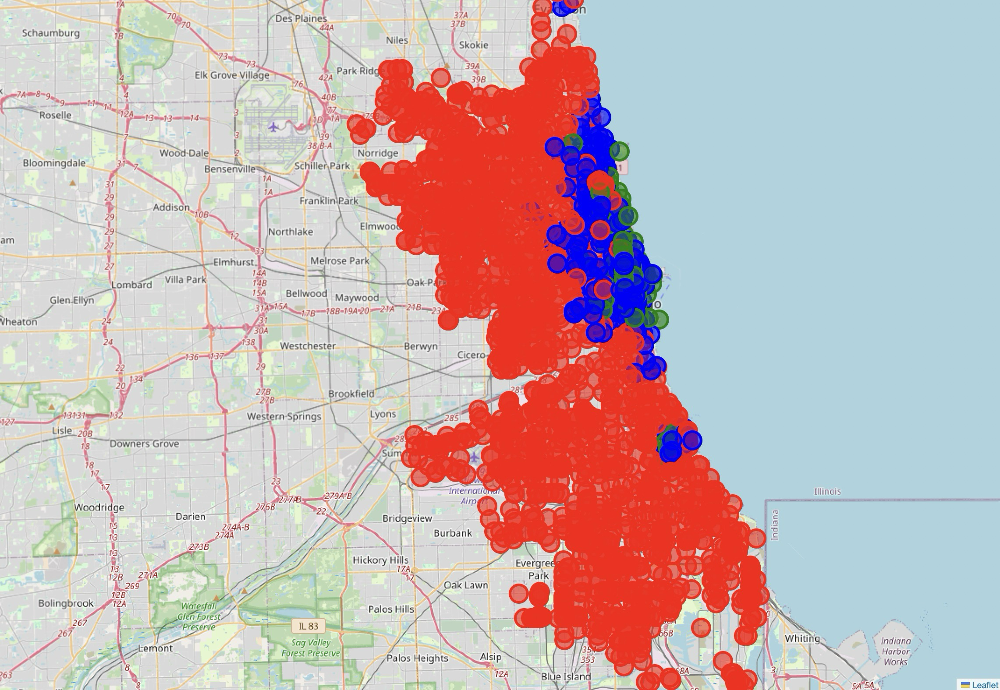

# Intermediate EDA - Customer Segmentation

### Based on most common routes

In [ ]:
# Top 20 most common routes
common_routes = (
    data.groupby(['start_station_name', 'end_station_name'])['ride_id']
    .count()
    .reset_index(name='total_rides')
    .sort_values(by='total_rides', ascending=False)
    .head(20)
)

# Merge for rider type stats
top_routes_merged = data.merge(
    common_routes[['start_station_name', 'end_station_name']],
    on=['start_station_name', 'end_station_name'],
    how='inner'
)

# Count member vs casual in these routes
route_rider_stats = (
    top_routes_merged.groupby(['start_station_name', 'end_station_name', 'member_casual'])['ride_id']
    .count()
    .unstack(fill_value=0)
    .reset_index()
)

# Add total & percentages
route_rider_stats['total'] = route_rider_stats['casual'] + route_rider_stats['member']
route_rider_stats['casual_pct'] = (route_rider_stats['casual'] / route_rider_stats['total'] * 100).round(2)
route_rider_stats['member_pct'] = (route_rider_stats['member'] / route_rider_stats['total'] * 100).round(2)

route_rider_stats


member_casual,start_station_name,end_station_name,casual,member,total,casual_pct,member_pct
0,Calumet Ave & 33rd St,State St & 33rd St,932,12166,13098,7.12,92.88
1,DuSable Lake Shore Dr & Monroe St,DuSable Lake Shore Dr & Monroe St,15970,1494,17464,91.45,8.55
2,DuSable Lake Shore Dr & Monroe St,Streeter Dr & Grand Ave,11516,930,12446,92.53,7.47
3,DuSable Lake Shore Dr & North Blvd,DuSable Lake Shore Dr & North Blvd,4998,1256,6254,79.92,20.08
4,Dusable Harbor,Dusable Harbor,6844,1050,7894,86.70,13.30
5,Dusable Harbor,Streeter Dr & Grand Ave,5244,732,5976,87.75,12.25
6,Ellis Ave & 55th St,Ellis Ave & 60th St,2924,8568,11492,25.44,74.56
7,Ellis Ave & 60th St,Ellis Ave & 55th St,3264,8772,12036,27.12,72.88
8,Ellis Ave & 60th St,University Ave & 57th St,2690,8950,11640,23.11,76.89
9,Loomis St & Lexington St,Morgan St & Polk St,556,5794,6350,8.76,91.24


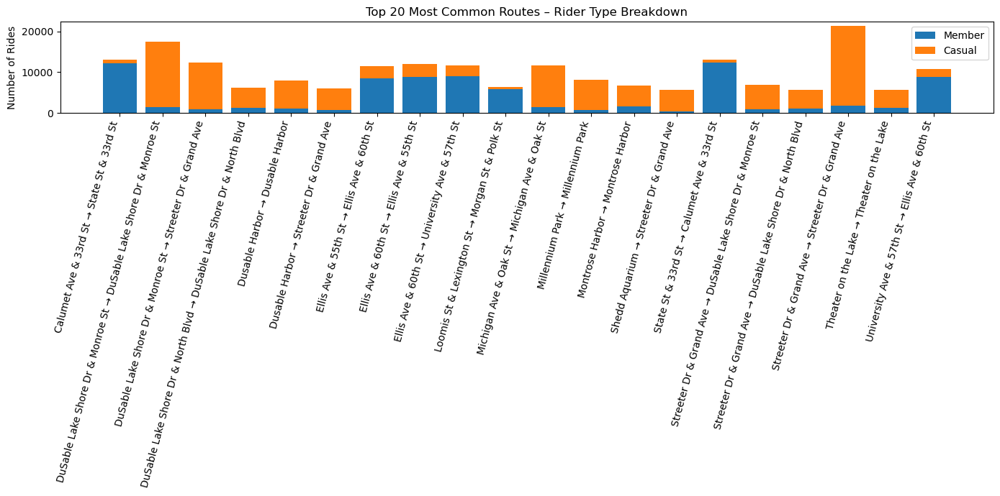

In [ ]:
plt.figure(figsize=(14, 7))

plt.bar(route_rider_stats['route'], route_rider_stats['member'], label='Member')
plt.bar(route_rider_stats['route'], route_rider_stats['casual'],
        bottom=route_rider_stats['member'], label='Casual')

plt.xticks(rotation=75, ha='right')
plt.ylabel("Number of Rides")
plt.title("Top 20 Most Common Routes – Rider Type Breakdown")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# import folium
# import pandas as pd

# # Step 1: Top 20 common routes
# common_routes = (
#     data.groupby(['start_station_name', 'end_station_name'])['ride_id']
#     .count()
#     .reset_index(name='total_rides')
#     .sort_values(by='total_rides', ascending=False)
#     .head(40)
# )

# # Step 2: Merge to filter data for these routes
# top_routes_data = data.merge(
#     common_routes[['start_station_name', 'end_station_name']],
#     on=['start_station_name', 'end_station_name'],
#     how='inner'
# )

# # Step 3: Rider type counts per route
# route_rider_stats = (
#     top_routes_data.groupby(
#         ['start_station_name', 'end_station_name', 'member_casual']
#     )['ride_id']
#     .count()
#     .unstack(fill_value=0)
#     .reset_index()
# )

# # Step 4: Determine dominant rider type (for color)
# route_rider_stats['dominant'] = route_rider_stats.apply(
#     lambda r: 'member' if r['member'] >= r['casual'] else 'casual',
#     axis=1
# )

# # Step 5: Get start/end coordinates
# coords = (
#     data.groupby(['start_station_name', 'end_station_name'])
#     [['start_lat', 'start_lng', 'end_lat', 'end_lng']]
#     .first()
#     .reset_index()
# )

# routes = route_rider_stats.merge(coords, on=['start_station_name', 'end_station_name'], how='left')

# # Step 6: Create map centered on Chicago
# m = folium.Map(location=[41.881832, -87.623177], zoom_start=12)

# # Step 7: Plot each route
# for _, row in routes.iterrows():

#     color = 'blue' if row['dominant'] == 'member' else 'orange'

#     # Add route line
#     folium.PolyLine(
#         locations=[
#             [row['start_lat'], row['start_lng']],
#             [row['end_lat'], row['end_lng']]
#         ],
#         color=color,
#         weight=4,
#         opacity=0.8
#     ).add_to(m)

#     # Start marker
#     folium.CircleMarker(
#         location=[row['start_lat'], row['start_lng']],
#         radius=3,
#         color=color,
#         fill=True,
#         popup=f"Start: {row['start_station_name']}"
#     ).add_to(m)

#     # End marker
#     folium.CircleMarker(
#         location=[row['end_lat'], row['end_lng']],
#         radius=3,
#         color=color,
#         fill=True,
#         popup=f"End: {row['end_station_name']}"
#     ).add_to(m)

# m.save('top_routes_map.html')


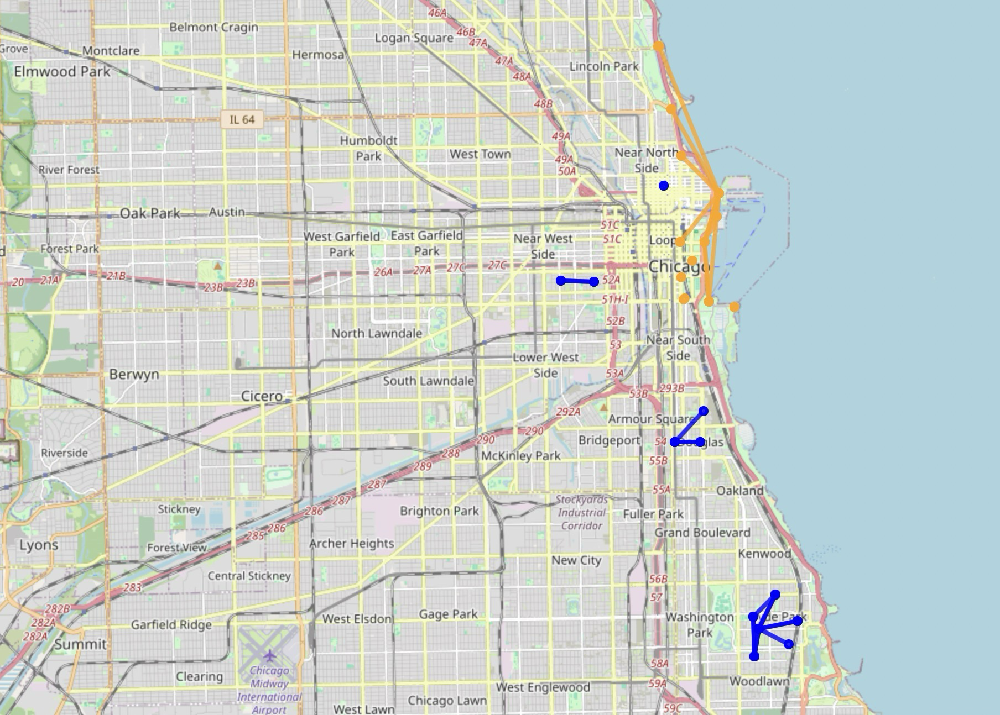

### Based on Day of the Week

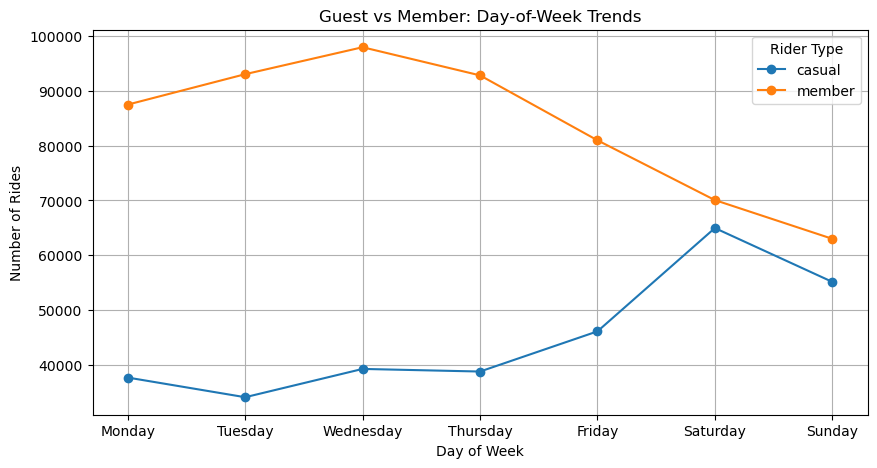

In [76]:
day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
rider_grouping_by_time = data.groupby(['day_of_week', 'member_casual'])['ride_id'].count().unstack()
rider_grouping_by_time = rider_grouping_by_time.reindex(day_order)

plt.figure(figsize=(10,5))
for col in rider_grouping_by_time.columns:
    plt.plot(rider_grouping_by_time.index, rider_grouping_by_time[col], marker='o', label=col)

plt.xlabel('Day of Week')
plt.ylabel('Number of Rides')
plt.title('Guest vs Member: Day-of-Week Trends')
plt.legend(title='Rider Type')
plt.grid(True)
plt.show()

### Day-of-Week Patterns for Top 50 Routes (Casual-Heavy vs Member-Heavy)

Tables showing exactly how many rides happened on each day for:
Casual-dominated routes
Member-dominated routes

Two clear bar charts:
Casual-heavy routes: typically peaks on weekends
Member-heavy routes: often peak weekdays (commutes)

=== Casual-Heavy Routes: Day-of-Week Ride Counts ===
day_of_week
Monday       2258
Tuesday      1564
Wednesday    1860
Thursday     1698
Friday       2554
Saturday     4300
Sunday       3752
Name: count, dtype: int64

=== Member-Heavy Routes: Day-of-Week Ride Counts ===
day_of_week
Monday       2206
Tuesday      2396
Wednesday    2406
Thursday     2226
Friday       2240
Saturday     1682
Sunday       1510
Name: count, dtype: int64


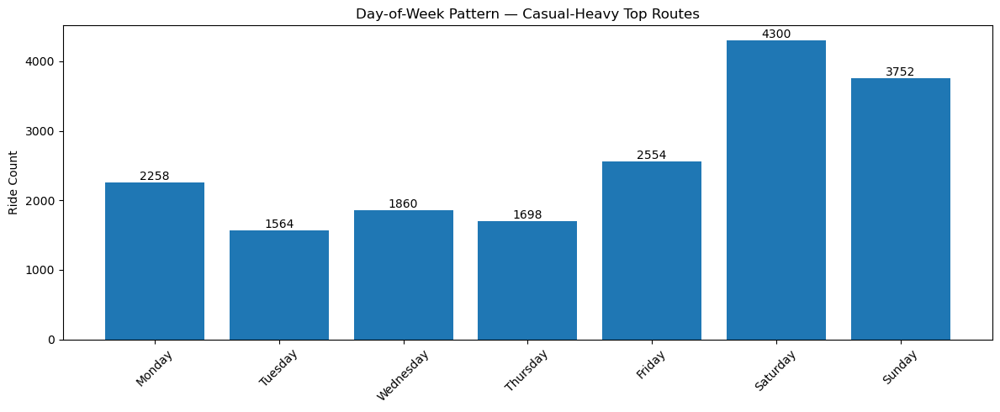

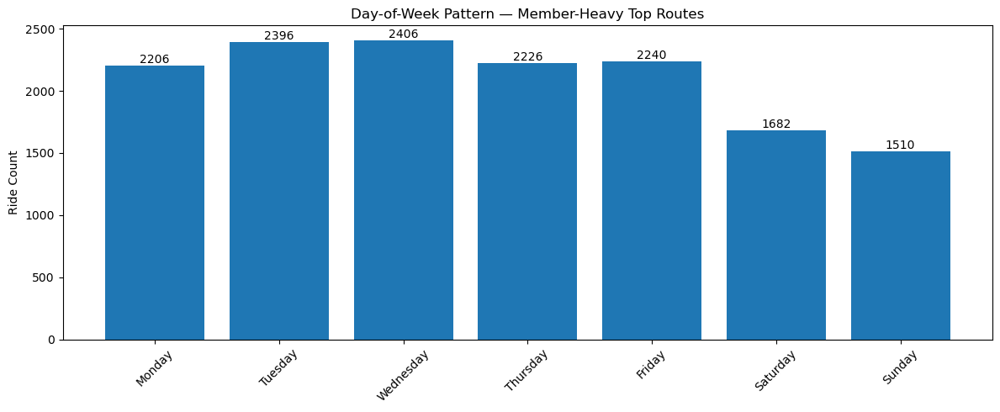

In [75]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Top 50 routes
common_routes = (
    data.groupby(['start_station_name', 'end_station_name'])['ride_id']
    .count()
    .reset_index(name='total_rides')
    .sort_values(by='total_rides', ascending=False)
    .head(50)
)

# 2. Filter dataset to only these routes
top_routes_data = data.merge(
    common_routes[['start_station_name', 'end_station_name']],
    on=['start_station_name', 'end_station_name'],
    how='inner'
)

# 3. Rider type stats to determine dominance
route_rider_stats = (
    top_routes_data.groupby(
        ['start_station_name', 'end_station_name', 'member_casual']
    )['ride_id']
    .count()
    .unstack(fill_value=0)
    .reset_index()
)

# 4. Determine dominant rider type per route
route_rider_stats['dominant'] = route_rider_stats.apply(
    lambda r: 'casual-heavy' if r['casual'] > r['member'] else 'member-heavy',
    axis=1
)

# Attach dominant labels back to the ride-level data
top_routes_data = top_routes_data.merge(
    route_rider_stats[['start_station_name', 'end_station_name', 'dominant']],
    on=['start_station_name', 'end_station_name'],
    how='left'
)

# 5. Split into two sets
casual_heavy = top_routes_data[top_routes_data['dominant'] == 'casual-heavy']
member_heavy = top_routes_data[top_routes_data['dominant'] == 'member-heavy']

# 6. Day-of-week counts
casual_by_day = casual_heavy['day_of_week'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)
member_by_day = member_heavy['day_of_week'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)

# 7. Print numbers
print("=== Casual-Heavy Routes: Day-of-Week Ride Counts ===")
print(casual_by_day)
print("\n=== Member-Heavy Routes: Day-of-Week Ride Counts ===")
print(member_by_day)

# 8. Plot visuals
plt.figure(figsize=(12,5))
plt.bar(casual_by_day.index, casual_by_day.values)
plt.title("Day-of-Week Pattern — Casual-Heavy Top Routes")
plt.ylabel("Ride Count")
plt.xticks(rotation=45)
for i, v in enumerate(casual_by_day.values):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,5))
plt.bar(member_by_day.index, member_by_day.values)
plt.title("Day-of-Week Pattern — Member-Heavy Top Routes")
plt.ylabel("Ride Count")
plt.xticks(rotation=45)
for i, v in enumerate(member_by_day.values):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


### Peak Ride Time Ranges for Customer-Heavy vs Member-Heavy Routes

Casual-heavy top-20 routes peak (hours covering ~50% of rides):
Hours included: [12, 13, 14, 15, 16]
Range: 12:00 - 16:00

Member-heavy top-20 routes peak (hours covering ~50% of rides):
Hours included: [12, 13, 14, 15, 16, 17, 18]
Range: 12:00 - 18:00


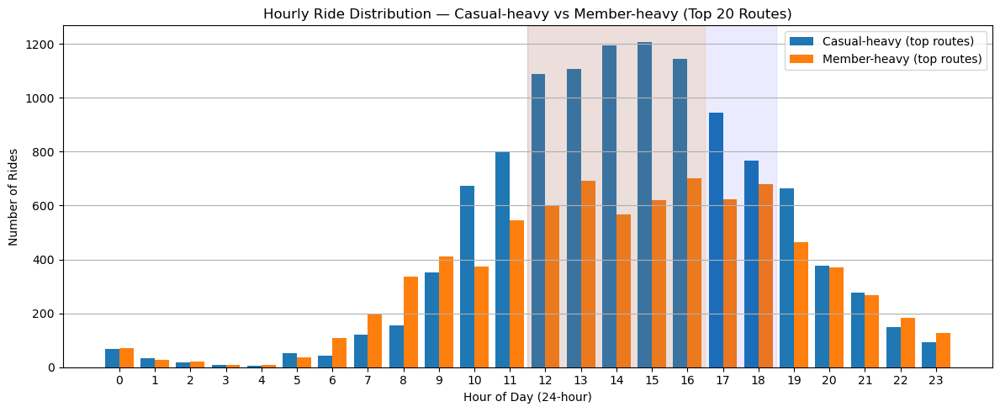

In [77]:
# 1. Top 20 routes
common_routes = (
    data.groupby(['start_station_name', 'end_station_name'])['ride_id']
    .count()
    .reset_index(name='total_rides')
    .sort_values(by='total_rides', ascending=False)
    .head(20)
)

# 2. Filter dataset to top-20 routes
top_routes_data = data.merge(
    common_routes[['start_station_name', 'end_station_name']],
    on=['start_station_name', 'end_station_name'],
    how='inner'
)

# 3. Determine dominance per route
route_rider_stats = (
    top_routes_data.groupby(['start_station_name', 'end_station_name', 'member_casual'])['ride_id']
    .count()
    .unstack(fill_value=0)
    .reset_index()
)
route_rider_stats['dominant'] = route_rider_stats.apply(
    lambda r: 'casual-heavy' if r.get('casual', 0) > r.get('member', 0) else 'member-heavy',
    axis=1
)

# 4. Merge dominance back to ride-level data
top_routes_data = top_routes_data.merge(
    route_rider_stats[['start_station_name', 'end_station_name', 'dominant']],
    on=['start_station_name', 'end_station_name'],
    how='left'
)

# 5. Helper: convert hour_of_day string like "10 AM" / "06 PM" to 24-hour int
def hour_str_to_int(s):
    try:
        return pd.to_datetime(s.strip(), format='%I %p', errors='coerce').hour
    except Exception:
        return pd.NaT

top_routes_data['hour_num'] = top_routes_data['hour_of_day'].astype(str).str.strip().map(lambda x: pd.to_datetime(x, format='%I %p', errors='coerce').hour)

# 6. Function to compute minimal set of hours covering given pct (default 50%) and return numeric range + hours list
def peak_hour_range(df, pct_threshold=0.5):
    counts = df['hour_num'].dropna().astype(int).value_counts().sort_values(ascending=False)
    if counts.empty:
        return {'hours': [], 'range': None, 'counts': counts}
    total = counts.sum()
    cumulative = counts.cumsum() / total
    selected_hours = cumulative[cumulative <= pct_threshold].index.tolist()
    # ensure at least the top hour is included (if first hour already > threshold)
    if not selected_hours:
        selected_hours = [counts.index[0]]
    # make sure we include the hour that tips over the threshold
    # (include the next hour if needed)
    cum_vals = counts.cumsum() / total
    cutoff_idx = cum_vals[cum_vals <= pct_threshold].index.tolist()
    if counts.index[0] not in selected_hours:
        selected_hours = cutoff_idx if cutoff_idx else [counts.index[0]]
    # To be robust, build selected set by iterating descending until threshold reached
    sel = []
    cum = 0
    for h, c in counts.items():
        sel.append(int(h))
        cum += c
        if cum/total >= pct_threshold:
            break
    sel_sorted = sorted(set(sel))
    hour_min = min(sel_sorted)
    hour_max = max(sel_sorted)
    return {'hours': sel_sorted, 'range': (hour_min, hour_max), 'counts': counts}

# 7. Compute for casual-heavy and member-heavy routes
casual_df = top_routes_data[top_routes_data['dominant'] == 'casual-heavy']
member_df = top_routes_data[top_routes_data['dominant'] == 'member-heavy']

casual_peak = peak_hour_range(casual_df, pct_threshold=0.5)
member_peak = peak_hour_range(member_df, pct_threshold=0.5)

# 8. Human readable formatting
def format_range(r):
    if not r:
        return "No data"
    start, end = r
    def fmt(h): return f"{h}:00" if h>=0 else ""
    return f"{fmt(start)} - {fmt(end)}"

print("Casual-heavy top-20 routes peak (hours covering ~50% of rides):")
print("Hours included:", casual_peak['hours'])
print("Range:", format_range(casual_peak['range']))
print()
print("Member-heavy top-20 routes peak (hours covering ~50% of rides):")
print("Hours included:", member_peak['hours'])
print("Range:", format_range(member_peak['range']))

# 9. Plots for visualization (hourly distributions)
hour_order = list(range(0,24))

casual_counts = casual_df['hour_num'].dropna().astype(int).value_counts().reindex(hour_order, fill_value=0)
member_counts = member_df['hour_num'].dropna().astype(int).value_counts().reindex(hour_order, fill_value=0)

plt.figure(figsize=(12,5))
plt.bar(casual_counts.index - 0.2, casual_counts.values, width=0.4, label='Casual-heavy (top routes)')
plt.bar(member_counts.index + 0.2, member_counts.values, width=0.4, label='Member-heavy (top routes)')
plt.xticks(hour_order)
plt.xlabel('Hour of Day (24-hour)')
plt.ylabel('Number of Rides')
plt.title('Hourly Ride Distribution — Casual-heavy vs Member-heavy (Top 20 Routes)')
plt.legend()
plt.grid(axis='y')
# annotate peak ranges on plot
if casual_peak['range']:
    plt.axvspan(casual_peak['range'][0]-0.5, casual_peak['range'][1]+0.5, color='orange', alpha=0.15)
if member_peak['range']:
    plt.axvspan(member_peak['range'][0]-0.5, member_peak['range'][1]+0.5, color='blue', alpha=0.08)
plt.tight_layout()
plt.show()


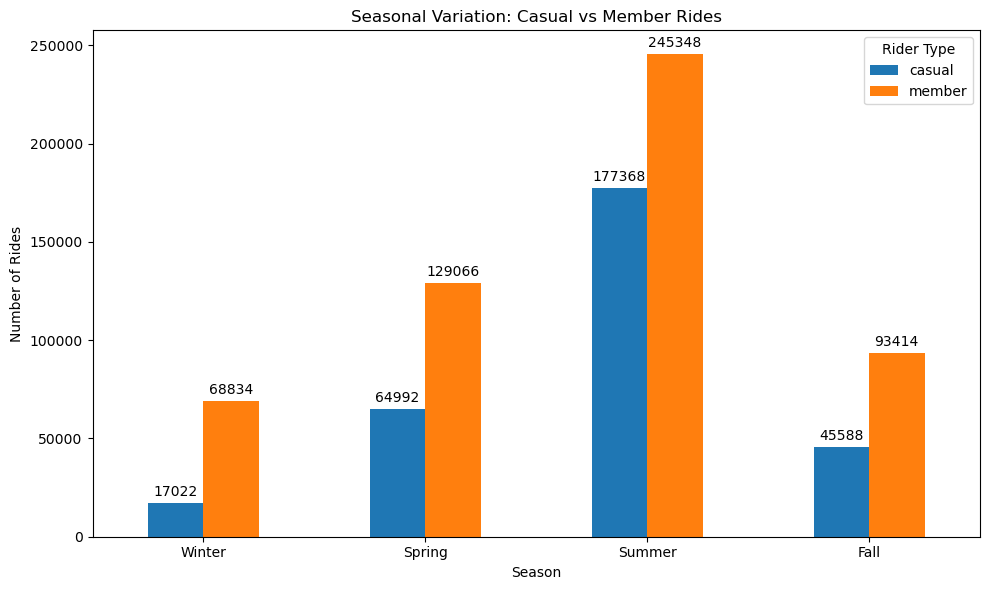

In [79]:
import matplotlib.pyplot as plt

# 1. Group by Season and Rider Type
season_rider_counts = (
    data.groupby(['Season', 'member_casual'])['ride_id']
    .count()
    .unstack(fill_value=0)
    .reindex(index=['Winter', 'Spring', 'Summer', 'Fall'])
)

# 2. Plot grouped bar chart
ax = season_rider_counts.plot(kind='bar', figsize=(10,6))
ax.set_xlabel('Season')
ax.set_ylabel('Number of Rides')
ax.set_title('Seasonal Variation: Casual vs Member Rides')
plt.xticks(rotation=0)
plt.legend(title='Rider Type')

# 3. Show counts on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

plt.tight_layout()
plt.show()


# Important Findings

1) Among the top 20 routes, we see that for each route where the casual riders are high in numbers, members are very low, and vice versa. This suggest that casual riders are taking the rides from stations which are the tourist destinations and the riders might be tourists. For example,Streeter Dr & Grand Ave to Streeter Dr & Grand Ave has total 21314 rides out of which casual riders are 91.63 percent, and upon cheecking google, this is a tourist desitantion. Where as stations like Ellis Ave & 60th St, State St & 33rd St, etc. are mostly the campus areas of Illinois Institue of Technology, university of chicago or residential areas. (see the map above. Casual riders dominant routes are along the beach)

2) Most of members ride during weekdays, and casual ride on weekends which again support the possibility of tourists. See the trends above - graph 2 and 3. Increase in casual dominant routes on weekends and Increase in casual dominant routes on weekdays

3) Member-dominant routes:
The rides on member-heavy routes are spread out across the entire day. There isn’t one specific time where there’s a sudden spike. This makes sense because members usually use the bikes for commuting or regular travel, so they ride throughout the day depending on their routine.


Casual-dominant routes:
On the casual-heavy routes, most rides happen between 12 PM and 5 PM. This is the clear peak window. It suggests that these riders are likely tourists or recreational users who prefer riding during the afternoon when the weather is nice and they’re out exploring.

# Hypothesis

Things that can be done:

1) Predicting the average trip duration - we have to. ------ 
2) Time series analysis to predict the trends in 2025 - we can



4) Relating 3 things from the course show that ------ 
5) Write the pdf for final document ----- 

6) Weather & Seasonal Effects
If you merge Chicago weather data:
Trips vs temperature, rain, wind speed.
Member vs casual behavior on rainy vs sunny days.
Seasonal patterns beyond just “Winter/Summer” — e.g., hot weekdays vs cold weekends.

7) Bike Type Preferences
Compare rideable_type usage over time:
Classic vs electric bikes.
Morning/evening preferences.
Seasonal shifts (e.g., electric bikes in summer vs classic in winter).

1) EDA Remaining - Easy (Ahmad)

2) Three things from the course 
Vidushi - ML (Prediction)
Syeda - Probability Distribution
Humaira - 5 Hypothesis Testing


3) THe final paper:

 Introduction (Shorter) - Syeda
 Data (Shorter) - Ahmad
 Methods - Ahmad
 Results - Humaira
 Discussion - Vidushi
 Conclusion (Shorter) - Syeda


 Citations - Easy

You must have at least 3 complex aspects of your project. The list
below is non-exhaustive.
1. Large (or very small) data size - Fulfilled
2. Model customization/hyperparameter tuning
3. Comparing more than two models
4. Feature engineering (creating a target, or new features) - Fulfilled
5. Hand-creating a model
6. Creating a stream-lit app or other front-end (counts for 2)
7. No tutorial or walkthrough used - Fulfilled

Additional:

Front-end 
Time series 
Comparing more than two models

Hypothesis and Story